[Leveraging ESG Data to Operationalize Sustainability. November 11, 2020. Antoine Amend. Databricks](https://www.databricks.com/blog/2020/11/11/leveraging-esg-data-to-operationalize-sustainability.html)

https://www.databricks.com/notebooks/esgops_notebooks/01_vessel_etl.html

https://marinecadastre.gov/data/

[Office for Coastal Management, 2023: Nationwide Automatic Identification System 2022, https://www.fisheries.noaa.gov/inport/item/67336](https://www.fisheries.noaa.gov/inport/item/67336)

### M.1371 : Technical characteristics for an automatic identification system using time division multiple access in the VHF maritime mobile frequency band (Rec. ITU-R M.1371-5 )

https://www.itu.int/rec/R-REC-M.1371-5-201402-I/en

| Identifier No. | Vessel Type                                                  |
| -------------- | ------------------------------------------------------------ |
| 50             | Special craft                                                |
| 51             | Pilot vessel                                                 |
| 52             | Search and rescue vessels                                    |
| 53             | Tugs                                                         |
| 54             | Port tenders                                                 |
| 55             | Vessels with anti-pollution facilities or equipment          |
| 56             | Law enforcement vessels                                      |
| 57             | Spare – for assignments to local vessels                     |
| 58             | Spare – for assignments to local vessels                     |
| 59             | Medical transports (as defined in the 1949 Geneva Conventions and Additional Protocols) |
| 60             | Ships and aircraft of States not parties to an armed conflict |
| 0X             | Fishing vessels                                              |
| 1X             | Carrying dangerous goods (DG), harmful substances (HS), or marine pollutants (MP), or IMO hazard or pollutant category X |
| 2X             | Towing vessels                                               |
| 3X             | Vessels engaged in dredging or underwater operations         |
| 4X             | Vessels engaged in diving operations                         |
| 5X             | Reserved for future use                                      |
| 6X             | Passenger ships                                              |
| 7X             | Cargo ships                                                  |
| 8X             | Tankers                                                      |
| 9X             | Other types of ships                                         |

Table 53: Identifiers to be used by ships to report their type (Rec. ITU-R M.1371-5)

In [0]:
df_june = spark.read.table("ais.june")

In [0]:
from pyspark.sql import SparkSession

spark = SparkSession.builder.appName("GetSchema").getOrCreate()

df_june.printSchema()

root
 |-- MMSI: string (nullable = true)
 |-- BaseDateTime: timestamp (nullable = true)
 |-- LAT: double (nullable = true)
 |-- LON: double (nullable = true)
 |-- SOG: double (nullable = true)
 |-- COG: double (nullable = true)
 |-- Heading: double (nullable = true)
 |-- VesselName: string (nullable = true)
 |-- IMO: string (nullable = true)
 |-- CallSign: string (nullable = true)
 |-- VesselType: integer (nullable = true)
 |-- Status: integer (nullable = true)
 |-- Length: double (nullable = true)
 |-- Width: double (nullable = true)
 |-- Draft: double (nullable = true)
 |-- Cargo: string (nullable = true)
 |-- TranscieverClass: string (nullable = true)
 |-- filename: string (nullable = true)



In [0]:
from pyspark.sql.functions import count

# Show the number of entries
print("Number of entries in the ais.june table:", df_june.count())

Number of entries in the ais.june table: 249326112


In [0]:
display(df_june)

MMSI,BaseDateTime,LAT,LON,SOG,COG,Heading,VesselName,IMO,CallSign,VesselType,Status,Length,Width,Draft,Cargo,TranscieverClass,filename
367777550,2022-06-01T00:00:02.000+0000,28.10198,-96.93931,0.0,360.0,511.0,HARRY LEE,null,WDJ4420,52,0,0.0,0.0,0.0,52,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
367544180,2022-06-01T00:00:07.000+0000,46.16795,-123.9143,0.0,342.5,511.0,JEANNE ARAIN,null,WDG5186,30,15,18.0,null,null,30,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
368001000,2022-06-01T00:00:04.000+0000,29.05437,-90.2301,7.9,180.0,168.0,GRANT CANDIES,IMO9481374,WDE5747,90,0,89.0,18.0,6.0,0,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
366772750,2022-06-01T00:00:04.000+0000,48.52818,-122.801,16.2,276.1,277.0,WSF YAKIMA,IMO8835360,WCD7863,60,0,116.0,22.0,5.5,60,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
368102480,2022-06-01T00:00:03.000+0000,32.77822,-79.95351,0.0,360.0,511.0,CHARLESTON PRINCESS,null,WDK9315,69,0,69.0,19.0,2.2,69,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
366972280,2022-06-01T00:00:02.000+0000,29.74435,-95.10025,0.0,247.9,511.0,JOEY DEVALL,null,WYB7063,31,0,18.0,7.0,null,31,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
367344920,2022-06-01T00:00:00.000+0000,30.28591,-88.74167,6.5,271.0,272.0,JACK BINION,null,WDF2412,31,12,24.0,9.0,null,57,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
367305040,2022-06-01T00:00:01.000+0000,41.37956,-71.51142,0.0,226.3,305.0,BLOCK ISLAND,IMO8662763,WCX6756,60,0,57.0,11.0,null,60,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
368091590,2022-06-01T00:00:01.000+0000,25.76444,-80.14482,0.0,360.0,285.0,EAGLE_II,null,WDK8178,60,0,0.0,0.0,0.0,60,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
367599740,2022-06-01T00:00:06.000+0000,36.98998,-89.12939,2.1,290.1,511.0,PAIGE L STRAIT,null,WDH2646,31,0,46.0,12.0,null,31,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv


In [0]:
from pyspark.sql import SparkSession

spark = SparkSession.builder.appName("DropJuneCargo").getOrCreate()

spark.sql("DROP TABLE IF EXISTS ais.june_cargo")

Out[10]: DataFrame[]

In [0]:
from pyspark.sql import SparkSession

spark = SparkSession.builder.appName("CreateJuneCargo").getOrCreate()

df_june_cargo = df_june.filter(df_june.VesselType == 70)

df_june_cargo.write.mode("overwrite").saveAsTable("ais.june_cargo")

In [0]:
# read as a spark dataframe the table we created in the previous step
df_ais_june_cargo = spark.read.table("ais.june_cargo")

In [0]:
from pyspark.sql.functions import count

print("Number of entries in the ais.june_cargo table:", df_ais_june_cargo.count())

Number of entries in the ais.june_cargo table: 16864754


In [0]:
display(df_ais_june_cargo)

MMSI,BaseDateTime,LAT,LON,SOG,COG,Heading,VesselName,IMO,CallSign,VesselType,Status,Length,Width,Draft,Cargo,TranscieverClass,filename
357847000,2022-06-01T00:00:00.000+0000,30.0294,-90.70285,0.0,280.3,213.0,AMIS ELEGANCE,IMO9705421,H9VR,70,1,189.0,32.0,12.5,70,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
538007402,2022-06-01T00:00:04.000+0000,31.51417,-123.80794,9.9,313.6,318.0,YANGZHOU CONFIDENCE,IMO9774850,V7LX3,70,0,199.0,32.0,8.9,70,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
366938760,2022-06-01T00:00:06.000+0000,43.99675,-82.52566,13.8,162.6,163.0,SAM LAUD,IMO7390210,WZC7602,70,0,193.0,20.0,8.3,70,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
229988000,2022-06-01T00:00:02.000+0000,25.76595,-80.15103,0.0,182.2,92.0,CMA CGM TAGE,IMO9674555,9HA3777,70,5,299.0,48.0,14.8,74,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
316023341,2022-06-01T00:00:02.000+0000,41.71327,-87.54239,0.0,179.0,179.0,WHITEFISH BAY,IMO9639880,CFN6287,70,0,225.0,23.0,14.8,70,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
636017730,2022-06-01T00:00:05.000+0000,31.27264,-117.24619,16.8,341.6,341.0,CHIQUITA VENTURE,IMO9357080,A8LL8,70,0,204.0,28.0,11.0,79,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
357405000,2022-06-01T00:00:02.000+0000,41.39499,-66.92883,15.1,239.7,238.0,MSC POH LIN,IMO9279977,H8FC,70,0,294.0,32.0,13.6,71,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
477815200,2022-06-01T00:00:02.000+0000,31.35539,-123.87228,16.7,125.6,126.0,SEASPAN FRASER,IMO9351608,VRHB2,70,0,265.0,32.0,12.6,79,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
316044371,2022-06-01T00:00:01.000+0000,42.26402,-83.10516,0.0,231.0,20.0,HARVEST SPIRIT,IMO9655951,VDAY,70,0,152.0,22.0,7.5,70,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv
316011710,2022-06-01T00:00:02.000+0000,48.2849,-88.90857,13.1,275.3,272.0,ALGOMA HARVESTER,IMO9613939,XJBK,70,0,222.0,23.0,14.7,70,A,dbfs:/FileStore/tables/AIS_2022_06_01.csv


In [0]:
df_ais_june_cargo.printSchema()

root
 |-- MMSI: string (nullable = true)
 |-- BaseDateTime: timestamp (nullable = true)
 |-- LAT: double (nullable = true)
 |-- LON: double (nullable = true)
 |-- SOG: double (nullable = true)
 |-- COG: double (nullable = true)
 |-- Heading: double (nullable = true)
 |-- VesselName: string (nullable = true)
 |-- IMO: string (nullable = true)
 |-- CallSign: string (nullable = true)
 |-- VesselType: integer (nullable = true)
 |-- Status: integer (nullable = true)
 |-- Length: double (nullable = true)
 |-- Width: double (nullable = true)
 |-- Draft: double (nullable = true)
 |-- Cargo: string (nullable = true)
 |-- TranscieverClass: string (nullable = true)
 |-- filename: string (nullable = true)



In [0]:
from pyspark.sql.functions import count, desc

result_df = spark.read.table("ais.june_cargo").groupBy("MMSI") \
                        .agg(count("MMSI").alias("MMSI_count")) \
                        .orderBy(desc("MMSI_count"))

In [0]:
result_df.count()

Out[2]: 3064

In [0]:
display(result_df)

MMSI,MMSI_count
620765000,36672
367531780,36577
367066970,36519
367067960,35727
367761740,34511
368106220,34254
671087100,33952
338293000,33640
367353660,32077
367766220,31743


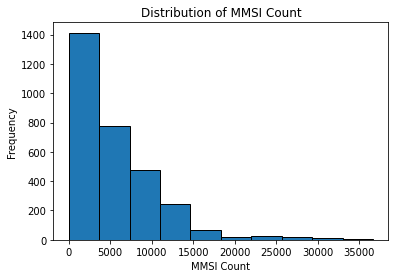

In [0]:
import matplotlib.pyplot as plt

# Extract the MMSI_count column from the DataFrame
mmsi_count = result_df.select("MMSI_count").rdd.flatMap(lambda x: x).collect()

# Create a histogram
plt.hist(mmsi_count, bins=10, edgecolor='black')
plt.xlabel("MMSI Count")
plt.ylabel("Frequency")
plt.title("Distribution of MMSI Count")
plt.show()

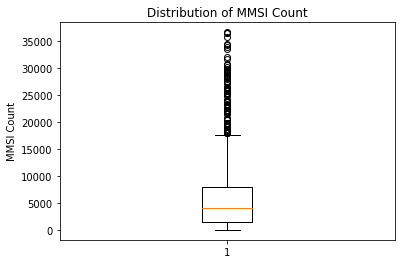

In [0]:
import matplotlib.pyplot as plt

# Extract the MMSI_count column from the DataFrame
mmsi_count = result_df.select("MMSI_count").rdd.flatMap(lambda x: x).collect()

# Create a box plot
plt.boxplot(mmsi_count)
plt.ylabel("MMSI Count")
plt.title("Distribution of MMSI Count")
plt.show()

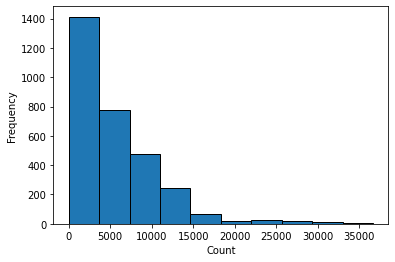

In [0]:
import matplotlib.pyplot as plt

# Convert Spark DataFrame to Pandas DataFrame
pandas_df = result_df.toPandas()

# Set the number of bins
num_bins = 10

# Create a histogram of the "MMSI_count" column with specified number of bins
plt.hist(pandas_df["MMSI_count"], bins=num_bins, edgecolor='black')

# Set the x-axis label
plt.xlabel("Count")

# Set the y-axis label
plt.ylabel("Frequency")

# Show the plot
plt.show()

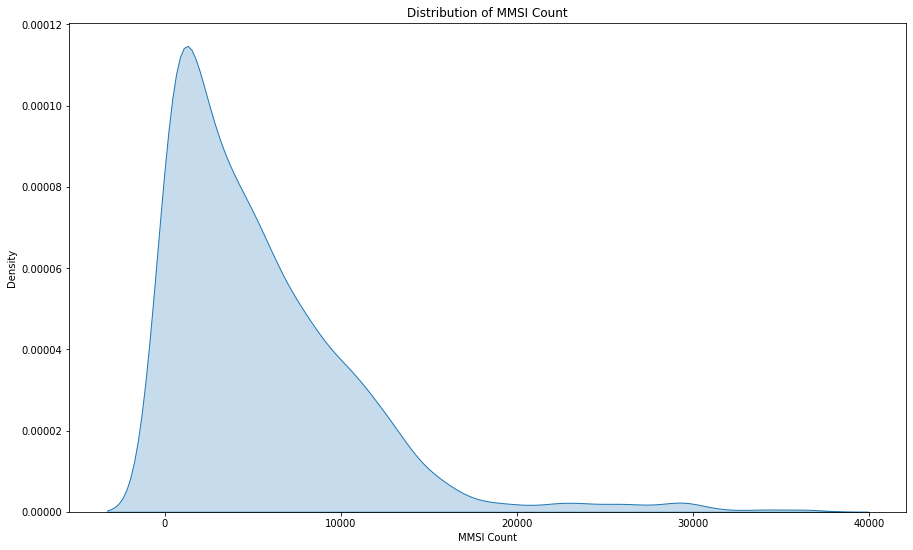

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extract the MMSI_count column from the DataFrame
mmsi_count = result_df.select("MMSI_count").rdd.flatMap(lambda x: x).collect()

# Create a larger figure
plt.figure(figsize=(15, 9))

# Create a KDE plot using seaborn
sns.kdeplot(mmsi_count, shade=True)
plt.xlabel("MMSI Count")
plt.ylabel("Density")
plt.title("Distribution of MMSI Count")
plt.show()